# Week 7 Check-In
## Team Spotiflies: Joanna, Aaron, Aubrey, Kennedy, Aster, Ethan
GitHub Link: https://github.com/ketexon/csm148-spotiflies

In [40]:
%pip install pandas numpy matplotlib seaborn scikit-learn mlxtend


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


## Setup and Preprocessing

Let's take our cleaned data set from Week 2, and split it into training and validation sets.

In [41]:
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.model_selection import train_test_split

# Reading in cleaned dataset from Week 2 Check-in
spotify = pd.read_csv("csv_outputs/cleaned_spotify.csv")

# For reproducability
random_seed = 42

# Splitting the data
# First split: separate out 20% for the test set
spotify_train_val, spotify_test = train_test_split(spotify, test_size=0.2, random_state=random_seed)

# Second split: separate remaining 80% into 60% training and 40% validation
spotify_train, spotify_val = train_test_split(spotify_train_val, test_size=0.25, random_state=random_seed)  # 0.25 * 0.8 = 0.2


## PCA

We want to use PCA for feature selection for clustering.

In [42]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Separate the genre column, as we want to investigate this later, but PCA only takes numeric values
genres = spotify_train['track_genre'] 

# Remove non-numeric columns for PCA (including categorical ones)
categorical_cols = ["mode", "key", "time_signature"]
def numeric(df: pd.DataFrame) -> pd.DataFrame:
    df_number = df.select_dtypes(include=[np.number])
    return df_number.loc[:,~df_number.columns.isin(categorical_cols)]
spotify_train_numeric = numeric(spotify_train)

# Standardize the numeric data for PCA
scaler = StandardScaler()
spotify_train_std = scaler.fit_transform(spotify_train_numeric)

# Perform PCA 
pca = PCA(n_components=10) # 10 components kept
pca_transformed = pca.fit_transform(spotify_train_std)


In [43]:
# Get explained variance
explained_variance_ratio = pca.explained_variance_ratio_

# Compute the cumulative explained variance
cumulative_variance_explained = explained_variance_ratio.cumsum()

# Create a DataFrame with PC, variability explained, and cumulative variability explained
pca_table = pd.DataFrame({
    'PC': [f'PC{i+1}' for i in range(len(explained_variance_ratio))],
    'variability_explained': explained_variance_ratio,
    'cumulative_variability_explained': cumulative_variance_explained
})

# Display the table
print(pca_table)


     PC  variability_explained  cumulative_variability_explained
0   PC1               0.261387                          0.261387
1   PC2               0.138698                          0.400086
2   PC3               0.112797                          0.512883
3   PC4               0.095433                          0.608316
4   PC5               0.087316                          0.695632
5   PC6               0.078214                          0.773846
6   PC7               0.075725                          0.849571
7   PC8               0.067014                          0.916585
8   PC9               0.041208                          0.957793
9  PC10               0.029479                          0.987272


In [44]:
# PCA Visualization
# Step 5: Add the PCA components to the DataFrame
spotify_train['PC1'] = pca_transformed[:, 0]
spotify_train['PC2'] = pca_transformed[:, 1]

# Step 6: Create the scatter plot with Plotly
fig = px.scatter(
    spotify_train,
    x='PC1',  # PCA Component 1
    y='PC2',  # PCA Component 2
    color='track_genre',  # Color by genre
    hover_data=['track_genre', 'PC1', 'PC2'],  # Display genre, PC1, and PC2 on hover
    title="PCA Scatter Plot Colored by Genre",
    labels={'PC1': 'PCA Component 1', 'PC2': 'PCA Component 2'}
)

# Show the plot
fig.show()

Some of the genres do seem to be clustered together on the visualization, such as soul (yellow) and acoustic (purple).

## Feature Selection

Now we will use our results from the PCA to select features for clustering. 

In [45]:
# Get the contribution of each original variable to the first two principal components
components = pd.DataFrame(pca.components_, columns=spotify_train_numeric.columns, index=[f'PC{i+1}' for i in range(pca.n_components_)])

# Identify the top contributing variables for each PC
top_variables = {}
for pc in components.index:
    sorted_vars = components.loc[pc].abs().sort_values(ascending=False)  # Sort by absolute value of contributions
    top_variables[pc] = sorted_vars.index[:5]  # Select top 5 variables for each PC

print("Top variables contributing to each principal component:")
for pc, vars in top_variables.items():
    print(f"{pc}: {list(vars)}")


Top variables contributing to each principal component:
PC1: ['loudness', 'energy', 'acousticness', 'valence', 'instrumentalness']
PC2: ['danceability', 'valence', 'duration_ms', 'instrumentalness', 'acousticness']
PC3: ['liveness', 'speechiness', 'danceability', 'duration_ms', 'acousticness']
PC4: ['popularity', 'instrumentalness', 'danceability', 'speechiness', 'valence']
PC5: ['tempo', 'duration_ms', 'danceability', 'popularity', 'speechiness']
PC6: ['speechiness', 'tempo', 'popularity', 'danceability', 'instrumentalness']
PC7: ['duration_ms', 'tempo', 'instrumentalness', 'valence', 'acousticness']
PC8: ['instrumentalness', 'liveness', 'valence', 'speechiness', 'popularity']
PC9: ['valence', 'danceability', 'liveness', 'energy', 'tempo']
PC10: ['acousticness', 'loudness', 'instrumentalness', 'energy', 'valence']


In [46]:
# Get the contribution of each original variable to the first two principal components
components = pd.DataFrame(pca.components_, columns=spotify_train_numeric.columns, 
                          index=[f'PC{i+1}' for i in range(pca.n_components_)])

# Calculate the absolute contribution of each variable to all principal components
abs_contributions = components.abs()

# Sum the contributions across all PCs for each variable
total_contributions = abs_contributions.sum(axis=0)

# Sort the variables by their total contribution
sorted_variables = total_contributions.sort_values(ascending=False)

# Select the top 5 variables
top_5_variables = sorted_variables.head(5)

# Print the top 5 variables contributing to all principal components
print("Top 5 variables contributing to all principal components:")
print(top_5_variables)

top_5_variable_names = top_5_variables.index.tolist()

Top 5 variables contributing to all principal components:
instrumentalness    2.800914
danceability        2.630594
liveness            2.479866
speechiness         2.472281
valence             2.468695
dtype: float64


From this, it seems that the variables that are contributing most to the PC are instrumentalness, danceability, liveness, speechiness, and valence. We will use this for clustering.

## Clustering
### K-Means Clustering

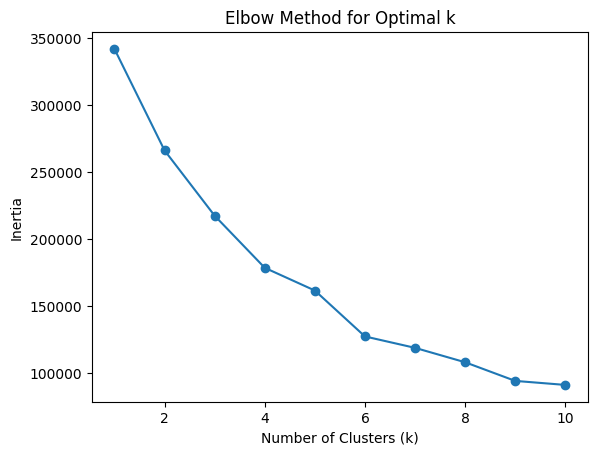

In [47]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Features to cluster -- based on PCA
features = spotify_train[top_5_variable_names] 

# Standardizing for clustering
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Compute KMeans for a range of k values
inertia = []
k_range = range(1, 11)  # Trying k from 1 to 10 clusters
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=random_seed)
    kmeans.fit(features_scaled)
    inertia.append(kmeans.inertia_)

# Plot the Elbow curve in order to find how many clusters we want
plt.plot(k_range, inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

Based on the elbow curve, which tells us the inertia (WSS) of the clusters at different k values, it seems like a good cut-off point for number of clusters is around 5 or 6, as we still want a meaningful amount of clusters (not too many), but also still have a grouping effect. 

We decided to re-apply K-means with both 5 and 6 clusters and replot.

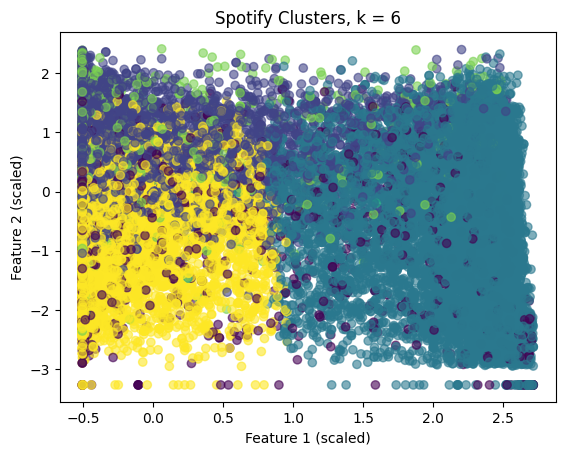

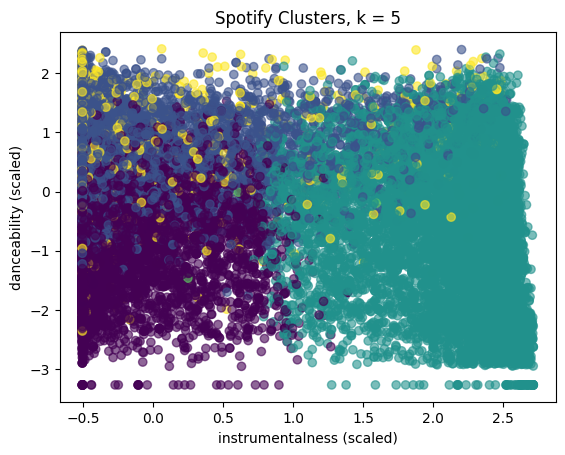

In [48]:
# Step 4: Apply K-Means with the chosen number of clusters based on Elbow Method -- 6
optimal_k = 6
kmeans_6 = KMeans(n_clusters=optimal_k, random_state=random_seed)
clusters_6 = kmeans_6.fit_predict(features_scaled)

# Step 5: Add the cluster labels back to the original dataset
spotify_train['cluster'] = clusters_6 

# Visualize the clusters (using a 2D plot of the first two features for simplicity)
plt.scatter(features_scaled[:, 0], features_scaled[:, 1], c=clusters_6 , cmap='viridis', alpha=0.6)
plt.title('Spotify Clusters, k = 6')
plt.xlabel('Feature 1 (scaled)')
plt.ylabel('Feature 2 (scaled)')
plt.show()

# Step 4: Apply K-Means with the chosen number of clusters based on Elbow Method --5
optimal_k = 5
kmeans_5 = KMeans(n_clusters=optimal_k, random_state=random_seed)
clusters_5 = kmeans_5.fit_predict(features_scaled)

# Step 5: Add the cluster labels back to the original dataset
spotify_train['cluster'] = clusters_5

# Visualize the clusters (using a 2D plot of the first two features for simplicity)
plt.scatter(features_scaled[:, 0], features_scaled[:, 1], c=clusters_5, cmap='viridis', alpha=0.6)
plt.title('Spotify Clusters, k = 5')
plt.xlabel(f'{top_5_variable_names[0]} (scaled)')
plt.ylabel(f'{top_5_variable_names[1]} (scaled)')
plt.show()

Based on this, it seems like the k = 5 cluster seems like enough clusters to capture our data, as the k=6 clustering seems to have some clusters that are very widespread and may be capturing relationships that are too specific. 

We also decided to see how these clusters may relate to genre of the song, and see if the clustering possibly was similar to the songs' groupings by genre.

In [52]:
import plotly.express as px

# Step 6: Map genres to colors
unique_genres = spotify_train['track_genre'].unique()
genre_colors = {genre: plt.cm.tab10(i % 10) for i, genre in enumerate(unique_genres)}

# Step 7: Add the genre colors and cluster information to the DataFrame
spotify_train['genre_color'] = spotify_train['track_genre'].map(genre_colors)
spotify_train['cluster'] = spotify_train['cluster'].astype(str)  # Ensure cluster is string for better hover info

# Create a Plotly scatter plot
fig = px.scatter(spotify_train,
                 x=top_5_variable_names[0], 
                 y=top_5_variable_names[1],
                 color='track_genre',  # Color by genre
                 symbol='cluster',  # Different markers for clusters
                 hover_data={'track_genre': True},  # Show genre, track, and artist on hover
                 title='Spotify Clusters Colored by Genre and Shaped by Cluster',
                 opacity=0.7)

# Show the plot
fig.show()


Though the above visualization is a bit messy, can see that with some clusters, they do seem to possibly have some relationship. For example, there's a cluster of purple points (acoustic genre) on the left, a cluster of pink (detroit-techno genre) in the top right, and red (new-age genre) seems to be clustered in the bottom right. 

### Evaluation Metrics

Though we mainly visualized K-means with 5 clusters, we can compare its metrics with k = 6 clusters. 

In [53]:
from sklearn.metrics import silhouette_score, silhouette_samples, rand_score, adjusted_rand_score

# Calculate WSS for k=5 and k=6
wss_5 = kmeans_5.inertia_
wss_6 = kmeans_6.inertia_

# Calculate Silhouette Scores for k=5 and k=6
# silhouette_5 = silhouette_score(features_scaled, clusters_5)
# silhouette_6 = silhouette_score(features_scaled, clusters_6)

# Calculate Rand Index between k=5 and k=6
rand_index = rand_score(clusters_5, clusters_6)

# Print Results
print("WSS for k=5:", wss_5)
print("WSS for k=6:", wss_6)
# print("Silhouette Score for k=5:", silhouette_5)
# print("Silhouette Score for k=6:", silhouette_6)
print("Rand Index between k=5 and k=6:", rand_index)


WSS for k=5: 161469.91152655205
WSS for k=6: 127167.17129629789
Rand Index between k=5 and k=6: 0.9300937051930761


The WSS scores for both of our k-means clusters is quite high.

## Summary